In [1]:
from dataclasses import dataclass
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.manifold import MDS, TSNE
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import torch
from torch import nn
from typing import Literal

# Visualize Fold 6 and Fold 7

Perform visualization on the embeddings produced by pretrained models.

## Data

In [2]:
train_path = '../data/train.csv'
test_path = '../data/test.csv'

train_df = pd.read_csv(train_path)
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 617 entries, 0 to 616
Data columns (total 58 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Id      617 non-null    object 
 1   AB      617 non-null    float64
 2   AF      617 non-null    float64
 3   AH      617 non-null    float64
 4   AM      617 non-null    float64
 5   AR      617 non-null    float64
 6   AX      617 non-null    float64
 7   AY      617 non-null    float64
 8   AZ      617 non-null    float64
 9   BC      617 non-null    float64
 10  BD      617 non-null    float64
 11  BN      617 non-null    float64
 12  BP      617 non-null    float64
 13  BQ      557 non-null    float64
 14  BR      617 non-null    float64
 15  BZ      617 non-null    float64
 16  CB      615 non-null    float64
 17  CC      614 non-null    float64
 18  CD      617 non-null    float64
 19  CF      617 non-null    float64
 20  CH      617 non-null    float64
 21  CL      617 non-null    float64
 22  CR

In [3]:
test_df = pd.read_csv(test_path)
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 57 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Id      5 non-null      object 
 1   AB      5 non-null      float64
 2   AF      5 non-null      float64
 3   AH      5 non-null      float64
 4   AM      5 non-null      float64
 5   AR      5 non-null      float64
 6   AX      5 non-null      float64
 7   AY      5 non-null      float64
 8   AZ      5 non-null      float64
 9   BC      5 non-null      float64
 10  BD      5 non-null      float64
 11  BN      5 non-null      float64
 12  BP      5 non-null      float64
 13  BQ      5 non-null      float64
 14  BR      5 non-null      float64
 15  BZ      5 non-null      float64
 16  CB      5 non-null      float64
 17  CC      5 non-null      float64
 18  CD      5 non-null      float64
 19  CF      5 non-null      float64
 20  CH      5 non-null      float64
 21  CL      5 non-null      float64
 22  CR    

### Data Preprocessing

In [4]:
imputer = SimpleImputer(strategy='median')
preprocessing = Pipeline([
    # ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler()),
])

In [5]:
X_df = train_df.drop(columns=['Id', 'Class', 'EJ'])
y = train_df['Class']
ej = train_df['EJ'].astype('category')

X_df = pd.DataFrame(
    imputer.fit_transform(X_df),
    columns=X_df.columns,
    index=X_df.index)
y = y.values

### Interaction Terms

In [6]:
def create_interaction_terms_between(df: pd.DataFrame, features: list[str]):
    assert all(f in df.columns for f in features)

    interactions = dict()

    for i, fst in enumerate(features):
        for snd in features[i+1:]:
            interactions[f'{fst}*{snd}'] = df[fst] * df[snd]

    return pd.DataFrame(interactions)

### Quadratic Terms

In [7]:
def create_quadratic_terms(df: pd.DataFrame, features: list[str]):
    assert all(f in df.columns for f in features)

    return X_df[features].pow(2.).rename(columns={
        f: f'{f}^2' for f in features
    })

In [8]:
Xinteractions_df = create_interaction_terms_between(X_df, X_df.columns)
X2_df = create_quadratic_terms(X_df, X_df.columns)

Xtrain_df = pd.concat([X_df, Xinteractions_df, X2_df], axis=1)

## Pretrained Models
### Neural Network Model

In [9]:
class NNClassifier(nn.Module):
    def __init__(self, input_shape: int) -> None:
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Linear(input_shape, 1024),
            nn.ReLU(),
            nn.Dropout(),
            nn.LayerNorm(1024),

            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Dropout(),
            nn.LayerNorm(512),

            nn.Linear(512, 64),
            # nn.Tanh(),
        )

        self.output = nn.Sequential(
            # nn.Dropout(),
            nn.LayerNorm(64),
            # nn.Dropout(),
            nn.Linear(64, 1),
        )

    def forward(self, x, *,
                mode: Literal['encoder', 'output', 'full'] = 'full',
                logit: bool = False):
        if mode == 'encoder':
            return self.encoder(x)
        elif mode == 'output':
            x = self.output(x)
            return x if logit else torch.sigmoid(x)
        elif mode == 'full':
            x = self.encoder(x)
            x = self.output(x)
            return x if logit else torch.sigmoid(x)

        raise ValueError(f'Unknown mode={mode}')


@dataclass
class TrainingResult:
    model: NNClassifier
    features: list[str]
    preprocessing: Pipeline
    performance: float


# Load pretrained models.
with open('./20230729_09_48_11.1e.model', 'rb') as inmodel:
    pretrained_models = pickle.load(inmodel)
    print(pretrained_models[0])

TrainingResult(model=NNClassifier(
  (encoder): Sequential(
    (0): Linear(in_features=83, out_features=1024, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
    (4): Linear(in_features=1024, out_features=512, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.5, inplace=False)
    (7): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
    (8): Linear(in_features=512, out_features=64, bias=True)
  )
  (output): Sequential(
    (0): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
    (1): Linear(in_features=64, out_features=1, bias=True)
  )
), features=['DU', 'DU*EU', 'FL', 'DU*GF', 'EH', 'GL', 'DU*GL', 'GI', 'AR', 'AR*CU', 'DI', 'EU', 'AY*GE', 'CC*GE', 'GE', 'EL', 'DE*FE', 'AB*FE', 'FE', 'DE', 'EE', 'DY', 'BC', 'CC*DF', 'DF', 'AB*DF', 'EB', 'AH*CU', 'AH', 'DV', 'CL', 'BZ', 'AY', 'EP', 'BN', 'CS*CU', 'CS', 'AY*DA', 'CU*DA', 'DA', 'CC*DN', 'DN', 'DL', 'CU', 'DH', 'AY*CU', 'AY*GH', 'CU*GH', 'GH', 'CC

## Visualize Folds

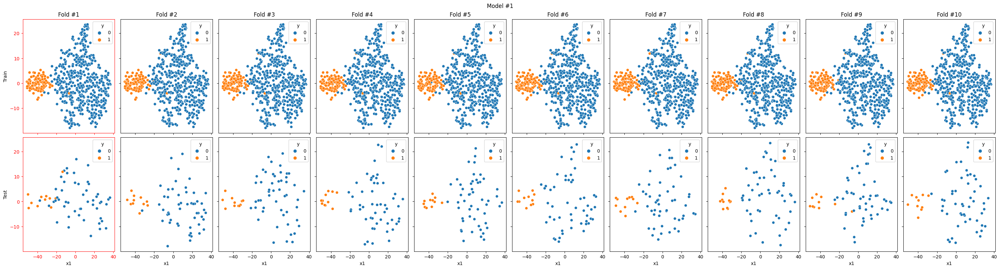

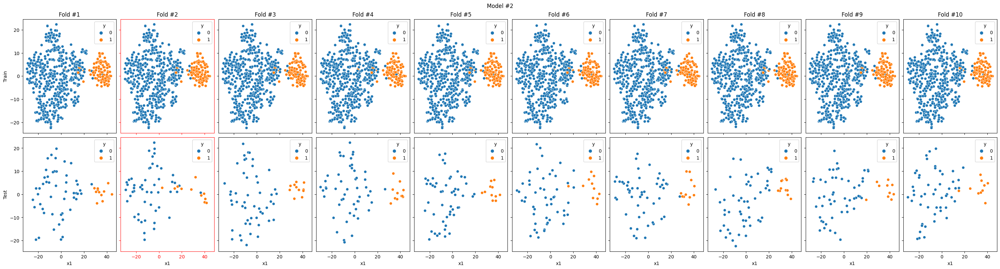

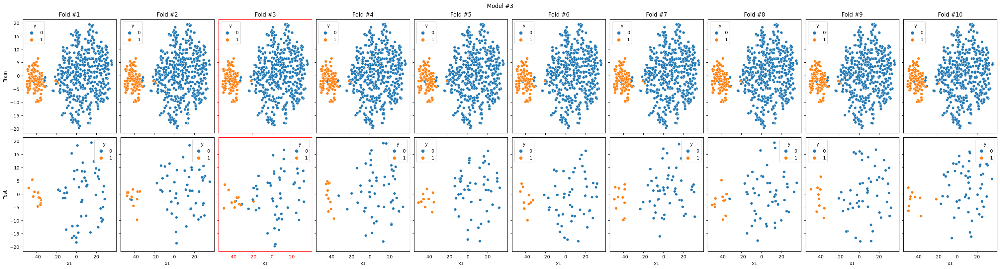

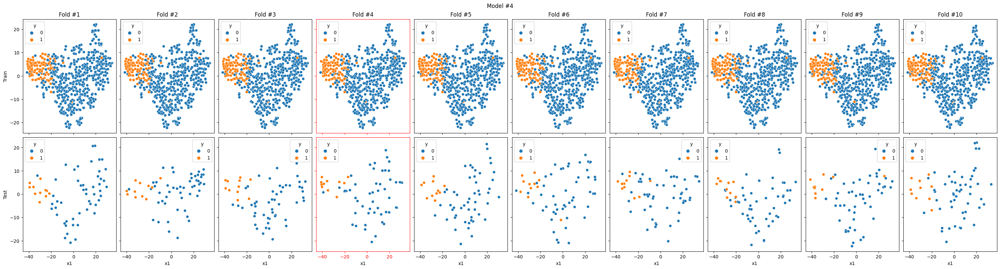

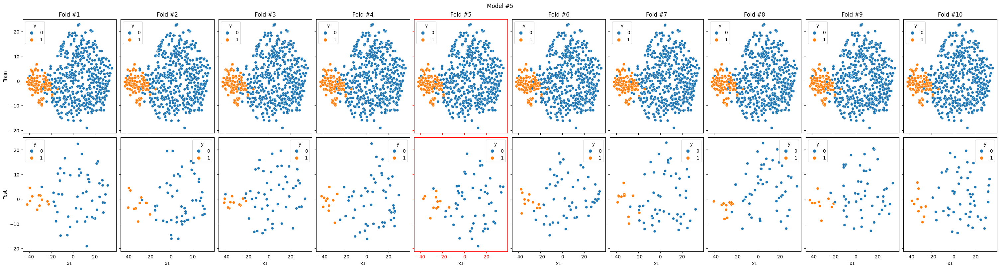

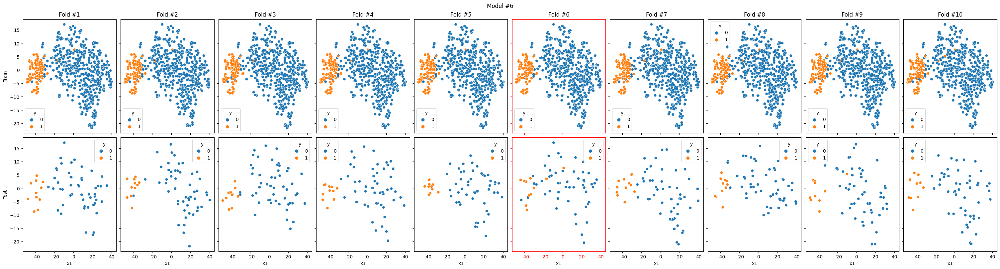

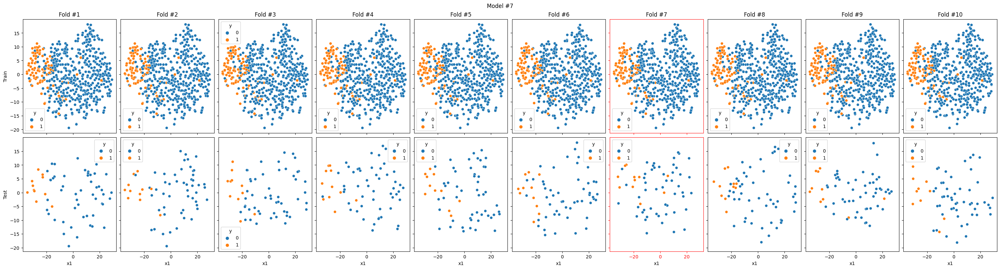

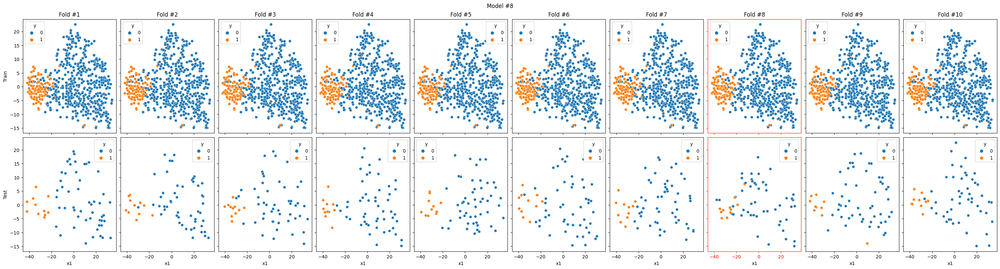

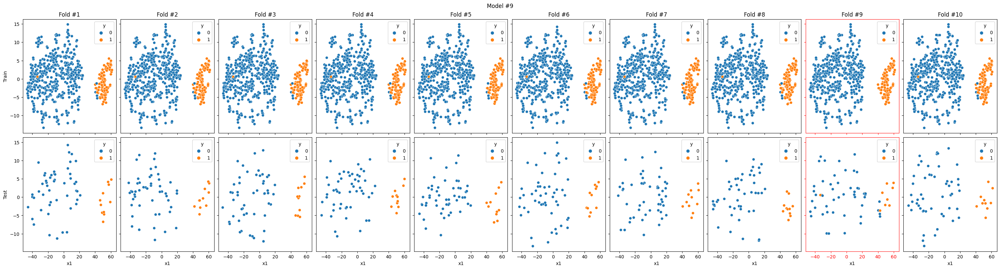

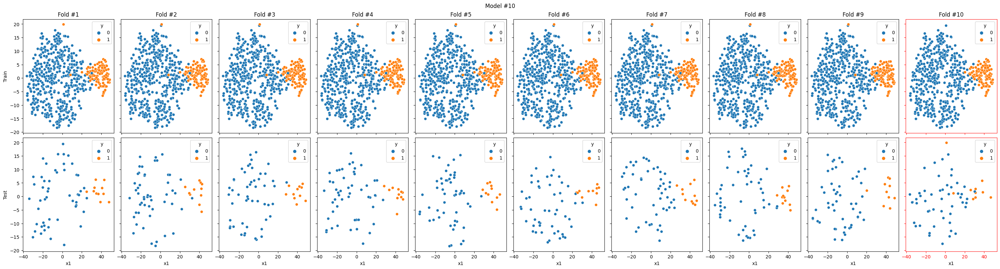

In [12]:
@dataclass
class KFoldData:
    X: pd.DataFrame
    g: pd.Series
    y: np.ndarray


def split_folds(X: pd.DataFrame, g: pd.Series, y: np.ndarray, n_folds: int):
    kfolds = StratifiedKFold(n_splits=n_folds)
    fold_data = []
    for train_idx, test_idx in kfolds.split(X, y):
        train = KFoldData(
            X=X.iloc[train_idx].copy(), g=g.iloc[train_idx], y=y[train_idx])
        test = KFoldData(
            X=X.iloc[test_idx].copy(), g=g.iloc[test_idx], y=y[test_idx])
        fold_data.append((train, test))

    return fold_data


def visualize_folds(*,
                    X: pd.DataFrame, g: pd.Series, y: np.ndarray,
                    pretrained_models: list[TrainingResult],
                    manifold_kwargs: dict | None = None,
                    device: str = 'cpu'):
    def data_embedding(X: pd.DataFrame, g: pd.Series, model: TrainingResult):
        X_processed = pd.DataFrame(
            pretrained_model.preprocessing.transform(X),
            columns=X.columns
        )[pretrained_model.features]
        X_processed['ej'] = g.cat.codes.values

        # Obtain the embeddeded features.
        X_embed = (
            pretrained_model
            .model(
                torch.tensor(X_processed.values,
                             dtype=torch.float32).to(device),
                mode='encoder')
            .cpu().detach().numpy())
        return X_embed

    n_folds = len(pretrained_models)
    kfolds = StratifiedKFold(n_splits=n_folds)
    for model_idx, pretrained_model in enumerate(pretrained_models):
        # Preprocess data.
        Xembed = data_embedding(X, g, pretrained_model)

        # Perform data reduction to visualize the folds.
        manifold_kwargs = (manifold_kwargs
                           if manifold_kwargs is not None else dict())
        Xembed_2d = (TSNE(n_components=2, **manifold_kwargs)
                     .fit_transform(Xembed))

        fig, axes = plt.subplots(
            nrows=2, ncols=n_folds, figsize=(30, 8),
            sharex=True, sharey=True,
            layout='constrained')
        fig.suptitle(f'Model #{model_idx + 1}')
        for fold, (_, test_idx) in enumerate(kfolds.split(Xembed_2d, y)):
            data = pd.DataFrame({
                'x1': Xembed_2d[:, 0],
                'x2': Xembed_2d[:, 1],
                'y': y,
            })
            data['ds'] = 'train'
            data.loc[test_idx, 'ds'] = 'test'

            ax = axes[0, fold]
            sns.scatterplot(data[data['ds'] == 'train'],
                            x='x1', y='x2', hue='y',
                            ax=ax)
            ax.set_title(f'Fold #{fold + 1}')

            ax = axes[1, fold]
            sns.scatterplot(data[data['ds'] == 'test'],
                            x='x1', y='x2', hue='y',
                            ax=ax)
            ax.set_title('')

            # Highlight the fold that the model was trained on.
            if fold == model_idx:
                for ax in axes[:, fold]:
                    ax.tick_params(color='red', labelcolor='red')
                    for spine in ax.spines.values():
                        spine.set_edgecolor('red')

        axes[0, 0].set_ylabel('Train')
        axes[1, 0].set_ylabel('Test')

        plt.show()
        plt.close(fig)


visualize_folds(
    X=Xtrain_df, g=ej, y=y,
    pretrained_models=pretrained_models,
    manifold_kwargs=dict())